<a href="https://colab.research.google.com/github/ian0549/Music-AI-app/blob/main/AI_Music_Generation_Algorithm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Copyright 2020 Perceptron.

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

https://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.

## **VOICE INPUT MUSIC GENERATIVE AI**

**IAN AKOTO**

Voice Input music generative ai is an automatic music composer that takes in recorded voice or lyrics of a user and predicts the best fitting background instrumentations and composes a music.

This notebook demonstrates running developing and running the model on user-supplied recordings


# Environment Setup

Including or importing package installation, libraries and data for building the model.

## Import Data From Bucket

In order to use Colaboratory with GCS, you'll need to create a Google Cloud project or use a pre-existing one.

Specify your project ID below:

In [ ]:
files = !! ls sample_data



for file in files:
  ! echo files

files
files
files


In [ ]:
# project id of your google cloud project

project_id = 'concrete-welder-293221'

In [ ]:
# enter your bucket name that contains the training data

bucket_name = 'data_msc_bucket'

In [ ]:
from google.colab import auth
auth.authenticate_user()

Download data

use gsutil to download bulk folder into colab

In [ ]:
!gcloud config set project {project_id}

Updated property [core/project].


In [ ]:
!mkdir data
!gsutil cp -r gs://data_msc_bucket/Genre data

In [ ]:
! ls data/Genre/Pop/

## Import and Install Libraries

In [ ]:
# install spleeter

!pip install spleeter

In [ ]:
# install tensorflow-io for audio augmentation and data preperation

!pip install -q tensorflow-io

     |████████████████████████████████| 25.3MB 1.4MB/s 


In [ ]:
! pip install librosa

In [ ]:
!pip install pydub 

In [ ]:
import numpy as np
import os
import pathlib
import tensorflow as tf
import tensorflow_io as tfio
import librosa
#import pydub 

from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import layers
from tensorflow.keras import models
from IPython import display
from IPython.display import Audio


import matplotlib.pyplot as plt
#import spleeter as sp
import glob

from tqdm import tqdm

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())

print("GPU is", "available" if tf.config.list_physical_devices('GPU') else "NOT AVAILABLE")

Version:  2.4.0
Eager mode:  True
GPU is NOT AVAILABLE


In [ ]:

def read(f, normalized=False):
    """MP3 to numpy array"""
    a = pydub.AudioSegment.from_mp3(f)
    y = np.array(a.get_array_of_samples())
    if a.channels == 2:
        y = y.reshape((-1, 2))
    if normalized:
        return a.frame_rate, np.float32(y) / 2**15
    else:
        return a.frame_rate, y

## Load and Play Sample Track

Load file and play using tensorflow

In [ ]:
#TODO: play sample track

audio_path ='/content/data/Genre/Pop/Acquainted.mp3'



def audio_to_tensor(filepath):
    """ this function takes file path of audio file and converts to tensor for 
        preprocession


        Input: file path

        Return: tensor
    """
    audio = tfio.audio.AudioIOTensor(audio_path)

    return audio


audio = audio_to_tensor(audio_path)

In [ ]:
Audio(audio_path, autoplay=True)

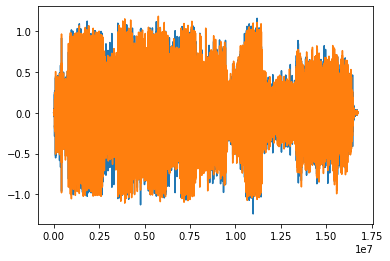

In [ ]:
# plot sample audio file

tensor = tf.cast(audio.to_tensor(), tf.float32) 

plt.figure()
plt.plot(tensor.numpy())

## Seperate Voice from Background using Spleeter

Using spleeter library, we are trying to use a sample music as input and seperate it into various vocal, drum, e.t.c

In [ ]:
!spleeter separate -i /content/data/Genre/Pop/Acquainted.mp3 -p spleeter:2stems -o /content/spleeter_out/

INFO:spleeter:Downloading model archive https://github.com/deezer/spleeter/releases/download/v1.4.0/2stems.tar.gz
INFO:spleeter:Validating archive checksum
INFO:spleeter:Extracting downloaded 2stems archive
INFO:spleeter:2stems model file(s) extracted
tcmalloc: large alloc 1572921344 bytes == 0xc0d82000 @  0x7fce41df11e7 0x7fce1917ee95 0x7fce19195a85 0x7fce1f3ee6ca 0x7fce1f9ce7a9 0x7fce1f9d0a0a 0x7fce1fa9b21d 0x7fce1fa9edbd 0x7fce1fa9f2af 0x7fce148edaef 0x7fce148e2af5 0x7fce149a0db1 0x7fce1499daa3 0x7fce1498cad5 0x7fce417b56db 0x7fce41aeea3f
tcmalloc: large alloc 1572921344 bytes == 0x126190000 @  0x7fce41df11e7 0x7fce1917ee95 0x7fce19195a85 0x7fce1f3ee6ca 0x7fce1f9ce7a9 0x7fce1f9d0a0a 0x7fce1fa9b21d 0x7fce1fa9edbd 0x7fce1fa9f2af 0x7fce148edaef 0x7fce148e2af5 0x7fce149a0db1 0x7fce1499daa3 0x7fce1498cad5 0x7fce417b56db 0x7fce41aeea3f
INFO:spleeter:File /content/spleeter_out/Acquainted/vocals.wav written succesfully
INFO:spleeter:File /content/spleeter_out/Acquainted/accompaniment.wav wr

In [ ]:
voice_path='/content/spleeter_out/Acquainted/vocals.wav'

background_path='/content/spleeter_out/Acquainted/accompaniment.wav'

In [ ]:
# play Voice seperated stem
Audio(voice_path)

In [ ]:

def sep_audio_Files(direcotry):
  """
  THis function uses spleeter to seperate audio files into voice and background

  Input:  i. music directory
          
  Return  message on complete        
  """

  print("music seperation algorithm starting")




  for filem in glob.glob(direcotry):
      #! echo $file
      path= f"'{filem}'"
      !spleeter separate -i $path -p spleeter:2stems -o /content/spleeter_out/
 

  print("music seperation ended successfully")


In [ ]:
sep_audio_Files("/content/data/Genre/Pop/*.mp3")

music seperation algorithm starting
tcmalloc: large alloc 1572921344 bytes == 0xeff96000 @  0x7f9a3bbd31e7 0x7f9a12f60e95 0x7f9a12f77a85 0x7f9a191d06ca 0x7f9a197b07a9 0x7f9a197b2a0a 0x7f9a1987d21d 0x7f9a19880dbd 0x7f9a198812af 0x7f9a0e6cfaef 0x7f9a0e6c4af5 0x7f9a0e782db1 0x7f9a0e77faa3 0x7f9a0e76ead5 0x7f9a3b5976db 0x7f9a3b8d0a3f
tcmalloc: large alloc 1572921344 bytes == 0x1553a4000 @  0x7f9a3bbd31e7 0x7f9a12f60e95 0x7f9a12f77a85 0x7f9a191d06ca 0x7f9a197b07a9 0x7f9a197b2a0a 0x7f9a1987d21d 0x7f9a19880dbd 0x7f9a198812af 0x7f9a0e6cfaef 0x7f9a0e6c4af5 0x7f9a0e782db1 0x7f9a0e77faa3 0x7f9a0e76ead5 0x7f9a3b5976db 0x7f9a3b8d0a3f
INFO:spleeter:File /content/spleeter_out/Sia - The Greatest/vocals.wav written succesfully
INFO:spleeter:File /content/spleeter_out/Sia - The Greatest/accompaniment.wav written succesfully
tcmalloc: large alloc 1101062144 bytes == 0xa6952000 @  0x7f2b468a01e7 0x7f2b1dc2de95 0x7f2b1dc44a85 0x7f2b23e9d6ca 0x7f2b2447d7a9 0x7f2b2447fa0a 0x7f2b2454a21d 0x7f2b2454ddbd 0x7f2b

## Store resulting Split sound data to gcp bucket

Output of the spleeter algorithm on music files are storing in gcp bucket for audio analysis and preprocessing for deep learning algorithms.

In [ ]:
from googleapiclient.http import MediaFileUpload


def put_to_bucket(folderpath,v_bucket_name, a_bucket_name):
  """
  This function filters each folder and gets the voice and background 
  of split music and renames it to the orinal music, then puts it on gcp bucket

  input: i. folder path containing the music split results
         ii. vocal bucket name to store data
          iii. accompaniment bucket name to store data

  """

  for folder in glob.glob(folderpath):

        # get the files
        files = [x for x in glob.glob(f"{folder}/*") ]

        
        if  len(files) != 0:
          accompaniment = files[0]
          vocal = files[1]
          p_name= os.path.basename(folder)

          vocal_name =str(p_name) + '_vocal.wav'
          accompaniment_name = str(p_name) + '_accompaniment.wav'


          # upload accompaniments
          accompaniment_media = MediaFileUpload(accompaniment, 
                          mimetype='audio/wav',
                          resumable=True)

          accompaniment_request = gcs_service.objects().insert(bucket=a_bucket_name, 
                                                name=accompaniment_name,
                                                media_body=accompaniment_media)

          response = None
          while response is None:
            # _ is a placeholder for a progress object that we ignore.
            # (Our file is small, so we skip reporting progress.)
            _, response = accompaniment_request.next_chunk()

          # upload vocals
          vocal_media = MediaFileUpload(vocal, 
                          mimetype='audio/wav',
                          resumable=True)

          vocal_request = gcs_service.objects().insert(bucket=v_bucket_name, 
                                                name=vocal_name,
                                                media_body=vocal_media)


          response = None
          while response is None:
            # _ is a placeholder for a progress object that we ignore.
            # (Our file is small, so we skip reporting progress.)
            _, response = vocal_request.next_chunk()


  print('Upload complete')


In [ ]:

from googleapiclient.discovery import build
gcs_service = build('storage', 'v1')

# Generate a  bucket name to which we'll upload the file.

extract_v_bucket_name = 'extraction_vocal_data'
extract_a_bucket_name = 'extraction_accompaniment_data'

v_body = {
  'name': extract_v_bucket_name,
  # For a full list of locations, see:
  # https://cloud.google.com/storage/docs/bucket-locations
  'location': 'us',
}

a_body = {
  'name': extract_a_bucket_name,
  # For a full list of locations, see:
  # https://cloud.google.com/storage/docs/bucket-locations
  'location': 'us',
}

#gcs_service.buckets().insert(project=project_id, body=v_body).execute()
#gcs_service.buckets().insert(project=project_id, body=a_body).execute()
print('Done')

In [ ]:
put_to_bucket("/content/spleeter_out/*",extract_v_bucket_name,extract_a_bucket_name)

Upload complete


# Start Here if Extracted Data is in the cloud

Download Extracted data from bucket to colab localdirectory for preprocessing and insight

In [ ]:
# download vocals data from bucket

!mkdir vocals
!gsutil cp -r gs://extraction_vocal_data vocals

In [ ]:
vocal_path = '/content/vocals/extraction_vocal_data/Adele - Set Fire To The Rain _vocal.wav'
music_path = "/content/data/Genre/Pop/Adele - Set Fire To The Rain .mp3"

In [ ]:
from scipy.io import wavfile

In [ ]:
#Load vocal the file on an object
data = wavfile.read(vocal_path)

# Separete the object elements
framerate = data[0]
sounddata = data[1]
time      = np.arange(0,len(sounddata))/framerate

# Show information about the object
print('Sample rate:',framerate,'Hz')
print('Total time:',len(sounddata)/framerate,'s')

Sample rate: 44100 Hz
Total time: 242.06401360544217 s


In [ ]:
# Erase output after import
from IPython.display import clear_output
clear_output()

In [ ]:
Audio(vocal_path)

In [ ]:
Audio(music_path)

## Create a Music DataSet

create a dataset to match vocals to actual or complete music track for preprocessing and audio analysis

In [ ]:
#create a data table with matched vocals ---> to music

import pandas as pd

def dataset(vocal_source,music_source):
  
  # create a new dataframe
  df = pd.DataFrame(columns = ['Name', 'Vocal_dir', 'Music_dir'])


  for music_file in glob.glob(music_source):

    # get basename of music
    m_name= str(os.path.basename(music_file)).replace('.mp3','')


    for vocal_file in glob.glob(vocal_source):

      # get basename of vocal to match music basename
      v_name= str(os.path.basename(vocal_file)).replace('_vocal.wav','')
      if(v_name == m_name):
        
        df = df.append({'Name' : v_name, 
                   'Vocal_dir' : vocal_file, 
                   'Music_dir' : music_file},  
                ignore_index = True) 

  return df


In [ ]:
music_dataset = dataset("/content/vocals/extraction_vocal_data/*.wav","/content/data/Genre/Pop/*.mp3")

In [ ]:
music_dataset.head()

,Name,Vocal_dir,Music_dir
0,Coldplay - Viva La Vida (Official Video),/content/vocals/extraction_vocal_data/Coldplay...,/content/data/Genre/Pop/Coldplay - Viva La Vid...
1,Sia - Unstoppable,/content/vocals/extraction_vocal_data/Sia - Un...,/content/data/Genre/Pop/Sia - Unstoppable.mp3
2,Katy Perry - Hot N Cold (Official),/content/vocals/extraction_vocal_data/Katy Per...,/content/data/Genre/Pop/Katy Perry - Hot N Col...
3,Feelings Fade Gnash (Feat. RKCB),/content/vocals/extraction_vocal_data/Feelings...,/content/data/Genre/Pop/Feelings Fade Gnash (F...
4,Katy Perry - Chained To The Rhythm (Official) ...,/content/vocals/extraction_vocal_data/Katy Per...,/content/data/Genre/Pop/Katy Perry - Chained T...


# Dataset Now ready for audio preprocessing



*   Performing plotting of both audio inputs 

*   Analyze the vocal wav using wav plot 

*   Analyze the mp3 music files in plot

*   Compare both plots to find out any relationships

*   Perform Short time fourior transforms

*   Convert STFF to MelSpectrograms

*   Analys Spectrograms

In [ ]:
# import libraries

import os
import pathlib

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import tensorflow as tf
import math

import tensorflow_datasets as tfds
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras import layers
from tensorflow.keras import models


from IPython import display


In [ ]:
num_samples = len(music_dataset)
print('Number of total examples:', num_samples)

Number of total examples: 187


In [ ]:
train_size = math.ceil(num_samples *0.7)
val_size = math.ceil(num_samples *0.2)
test_size = math.ceil(num_samples *0.1)

train_files = music_dataset[:train_size] 
val_files = music_dataset[train_size: train_size + val_size]
test_files = music_dataset[-(test_size-1):]

print('Training set size', len(train_files))
print('Validation set size', len(val_files))
print('Test set size', len(test_files))

Training set size 131
Validation set size 38
Test set size 18


# Reading audio files 

* Convert audio files into waveform

* Create  a dataset pipline for the audio waveform

In [ ]:
train_files.head()

,Name,Vocal_dir,Music_dir
0,Coldplay - Viva La Vida (Official Video),/content/vocals/extraction_vocal_data/Coldplay...,/content/data/Genre/Pop/Coldplay - Viva La Vid...
1,Sia - Unstoppable,/content/vocals/extraction_vocal_data/Sia - Un...,/content/data/Genre/Pop/Sia - Unstoppable.mp3
2,Katy Perry - Hot N Cold (Official),/content/vocals/extraction_vocal_data/Katy Per...,/content/data/Genre/Pop/Katy Perry - Hot N Col...
3,Feelings Fade Gnash (Feat. RKCB),/content/vocals/extraction_vocal_data/Feelings...,/content/data/Genre/Pop/Feelings Fade Gnash (F...
4,Katy Perry - Chained To The Rhythm (Official) ...,/content/vocals/extraction_vocal_data/Katy Per...,/content/data/Genre/Pop/Katy Perry - Chained T...


In [ ]:
train_files.Music_dir.values

In [ ]:
#data_audio_binary = tf.io.read_file('/content/data/Genre/Pop/Coldplay - Viva La Vida (Official Video).mp3')

audio = tfio.audio.AudioIOTensor('/content/data/Genre/Pop/Coldplay - Viva La Vida (Official Video).mp3').to_tensor()
print(audio)

tf.Tensor(
[[0. 0.]
 [0. 0.]
 [0. 0.]
 ...
 [0. 0.]
 [0. 0.]
 [0. 0.]], shape=(11621376, 2), dtype=float32)


In [ ]:
audio = tfio.IODataset.graph(tf.int32).from_audio('/content/data/Genre/Pop/Coldplay - Viva La Vida (Official Video).mp3')

dd= audio.as_numpy_iterator()
print(dd)

In [ ]:
def get_waveform_io(data,target):


  data_waveform = tfio.audio.AudioIOTensor(data).to_tensor()
  target_waveform =  tfio.audio.AudioIOTensor(target).to_tensor()
  


  return data_waveform, target_waveform

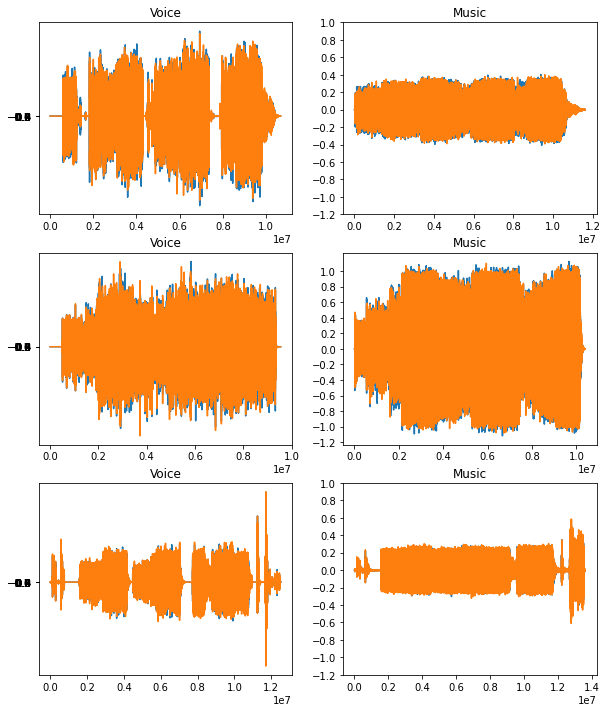

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(10, 12))
for i in range(3):
    voice, music = get_waveform_io(dataset[0][i],dataset[1][i])

    ax = axes[i][0]
    # voice
    ax.plot(voice)
    ax.set_yticks(np.arange(-1.2, 1.2, 0.2))
    ax.set_title('Voice')
    # music
    ax = axes[i][1]
    ax.plot(music)
    ax.set_yticks(np.arange(-1.2, 1.2, 0.2))
    ax.set_title('Music')

plt.show()

In [ ]:
def get_waveform(voice_file_path,music_file_path):
  
  voice_audio_binary = tf.io.read_file(voice_file_path)
  voice_dataset  = tfio.audio.decode_wav(voice_audio_binary,dtype=tf.int16)

  music_audio_binary = tf.io.read_file(music_file_path)
  music_dataset = tfio.audio.decode_mp3(music_audio_binary)

  return voice_dataset, music_dataset

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
dataset = (train_files.Vocal_dir.values, train_files.Music_dir.values)
files_ds = tf.data.Dataset.from_tensor_slices(dataset)
waveform_ds = files_ds.map(get_waveform, num_parallel_calls=AUTOTUNE)

Let's examine a few audio waveforms with their corresponding labels.

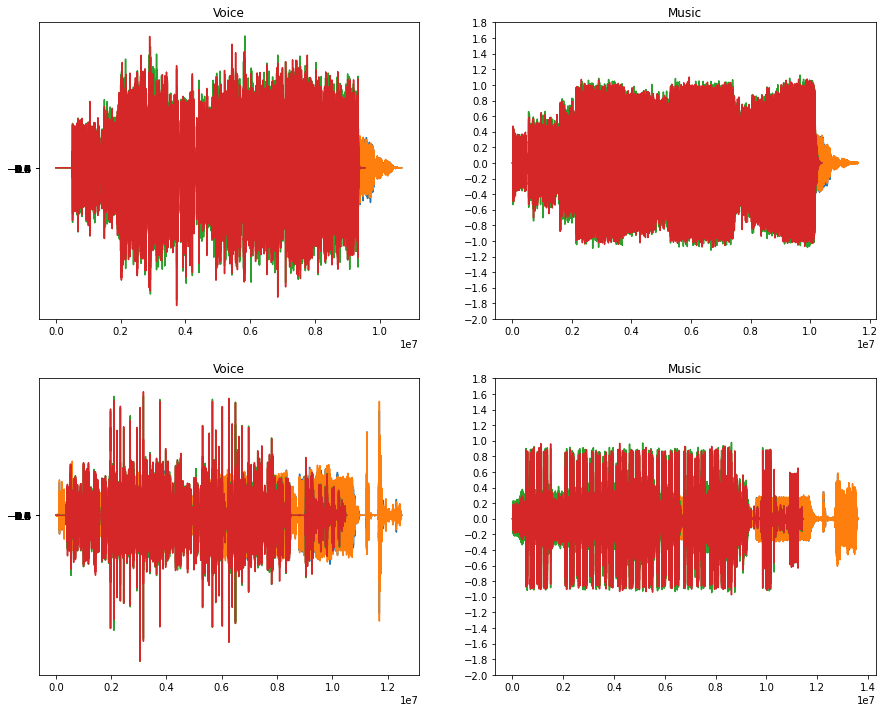

In [ ]:
rows = 2
cols = 2
n = rows*cols
fig, axes = plt.subplots(rows, cols, figsize=(15, 12))
for i, (audio_voice, audio_music) in enumerate(waveform_ds.take(n)):

  r = i // cols
  c = i % cols
  ax = axes[r][0]
  # voice
  ax.plot(audio_voice.numpy() )
  ax.set_yticks(np.arange(-2.0, 2.0, 0.2))
  ax.set_title('Voice')
  # music
  ax = axes[r][1]
  ax.plot( audio_music.numpy() )
  ax.set_yticks(np.arange(-2.0, 2.0, 0.2))
  ax.set_title('Music')

plt.show()


# Spectrogram

It is now time to convert the audio waveform into spectrograms for the model. the spectogram shows how  frequenty changes over time and represented as  a 2d image.


A Fourier transform (tf.signal.fft) converts a signal to its component frequencies, but loses all time information. The STFT (tf.signal.stft) splits the signal into windows of time and runs a Fourier transform on each window, preserving some time information, and returning a 2D tensor that you can run standard convolutions on.

STFT produces an array of complex numbers representing magnitude and phase. However, we only need the magnitude for this project, which can be derived by applying tf.abs on the output of tf.signal.stft.

Choose frame_length and frame_step parameters such that the generated spectrogram "image" is almost square.

You also want the waveforms to have the same length, so that when you convert it to a spectrogram image, the results will have similar dimensions. This can be done by simply zero padding the audio clips that are shorter than one second.

In [ ]:
def get_spectrogram(waveform):
  # Padding for files with less than 13000000 samples
  zero_padding = tf.zeros([13000000] - tf.shape(waveform), dtype=tf.float32)
  
  # Concatenate audio with padding so that all audio clips will be of the 
  # same length
  waveform = tf.cast(waveform, tf.float32)
  equal_length = tf.concat([waveform, zero_padding], 0)
  spectrogram = tf.signal.stft(
      equal_length, frame_length=255, frame_step=128)

  spectrogram = tf.abs(spectrogram)

  return spectrogram

 Compare the waveform, the spectrogram and the actual audio of one example from the dataset.

In [ ]:
for voice, music in waveform_ds.take(1):
  spectrogram = get_spectrogram(voice)


print('Waveform shape:', voice.shape)
print('Spectrogram shape:', spectrogram.shape)
print('Audio playback')
display.display(display.Audio(voice, rate=16000))